<div style="text-align: center;">
    <h1 style="font-size: 28px; font-weight: bold; color: #336699;">House Price Advanced Regression Techniques</h1>
    <h3 style="font-size: 18px; color: #555;">Data Scientist: Prashant Sundge</h3>
</div>

Welcome to my Jupyter Notebook dedicated to the analysis and prediction of house prices using advanced regression techniques. In this notebook, I will walk you through a comprehensive data analysis and machine learning project aimed at predicting house prices based on various features.



<h2 style="font-size: 24px; color: #336699;">Table of Contents</h2>

1. [Introduction](#introduction)
2. [Data Exploration](#data-exploration)
3. [Data Preprocessing](#data-preprocessing)
4. [Data Profiling](#data-Profiling)
5. [Feature Engineering](#feature-engineering)
6. [Model Building](#model-building)
7. [Model Evaluation](#model-evaluation)
8. [Conclusion](#conclusion)


<div style="text-align: left;">
    <h2 style="font-size: 24px; color: #336699;">Introduction</h2>
</div>

In the realm of real estate, accurately predicting house prices is of utmost importance for both buyers and sellers. This project focuses on using advanced regression techniques to develop a robust predictive model that can estimate house prices based on a multitude of factors.

The dataset we will be working with contains a wide range of features, including information about the properties, their location, and other relevant attributes. By leveraging various data science tools and techniques, we aim to create a model that provides accurate price estimates.


<div style="text-align: left;">
    <h2 style="font-size: 24px; color: #336699;">Data Exploration</h2>
</div>

Before diving into model building, it's essential to understand our data thoroughly. In this section, we will explore the dataset, visualize key insights, and gain insights into the relationships between different variables.


<div style="text-align: left;">
    <h3 style="font-size: 18px; color: #336699;">Data Fields</h3>
</div>

- **SalePrice**: the property's sale price in dollars. This is the target variable that you're trying to predict.
- **MSSubClass**: The building class
- **MSZoning**: The general zoning classification
- **LotFrontage**: Linear feet of street connected to property
- **LotArea**: Lot size in square feet
- **Street**: Type of road access
- **Alley**: Type of alley access
- **LotShape**: General shape of property
- **LandContour**: Flatness of the property
- **Utilities**: Type of utilities available
- **LotConfig**: Lot configuration
- **LandSlope**: Slope of property
- **Neighborhood**: Physical locations within Ames city limits
- **Condition1**: Proximity to main road or railroad
- **Condition2**: Proximity to main road or railroad (if a second is present)
- **BldgType**: Type of dwelling
- **HouseStyle**: Style of dwelling
- **OverallQual**: Overall material and finish quality
- **OverallCond**: Overall condition rating
- **YearBuilt**: Original construction date
- **YearRemodAdd**: Remodel date
- **RoofStyle**: Type of roof
- **RoofMatl**: Roof material
- **Exterior1st**: Exterior covering on house
- **Exterior2nd**: Exterior covering on house (if more than one material)
- **MasVnrType**: Masonry veneer type
- **MasVnrArea**: Masonry veneer area in square feet
- **ExterQual**: Exterior material quality
- **ExterCond**: Present condition of the material on the exterior
- **Foundation**: Type of foundation
- **BsmtQual**: Height of the basement
- **BsmtCond**: General condition of the basement
- **BsmtExposure**: Walkout or garden level basement walls
- **BsmtFinType1**: Quality of basement finished area
- **BsmtFinSF1**: Type 1 finished square feet
- **BsmtFinType2**: Quality of second finished area (if present)
- **BsmtFinSF2**: Type 2 finished square feet
- **BsmtUnfSF**: Unfinished square feet of basement area
- **TotalBsmtSF**: Total square feet of basement area
- **Heating**: Type of heating
- **HeatingQC**: Heating quality and condition
- **CentralAir**: Central air conditioning
- **Electrical**: Electrical system
- **1stFlrSF**: First Floor square feet
- **2ndFlrSF**: Second floor square feet
- **LowQualFinSF**: Low quality finished square feet (all floors)
- **GrLivArea**: Above grade (ground) living area square feet
- **BsmtFullBath**: Basement full bathrooms
- **BsmtHalfBath**: Basement half bathrooms
- **FullBath**: Full bathrooms above grade
- **HalfBath**: Half baths above grade
- **Bedroom**: Number of bedrooms above basement level
- **Kitchen**: Number of kitchens
- **KitchenQual**: Kitchen quality
- **TotRmsAbvGrd**: Total rooms above grade (does not include bathrooms)
- **Functional**: Home functionality rating
- **Fireplaces**: Number of fireplaces
- **FireplaceQu**: Fireplace quality
- **GarageType**: Garage location
- **GarageYrBlt**: Year garage was built
- **GarageFinish**: Interior finish of the garage
- **GarageCars**: Size of garage in car capacity
- **GarageArea**: Size of garage in square feet
- **GarageQual**: Garage quality
- **GarageCond**: Garage condition
- **PavedDrive**: Paved driveway
- **WoodDeckSF**: Wood deck area in square feet
- **OpenPorchSF**: Open porch area in square feet
- **EnclosedPorch**: Enclosed porch area in square feet
- **3SsnPorch**: Three-season porch area in square feet
- **ScreenPorch**: Screen porch area in square feet
- **PoolArea**: Pool area in square feet
- **PoolQC**: Pool quality
- **Fence**: Fence quality
- **MiscFeature**: Miscellaneous feature not covered in other categories
- **MiscVal**: Value of miscellaneous feature
- **MoSold**: Month Sold
- **YrSold**: Year Sold
- **SaleType**: Type of sale
- **SaleCondition**: Condition of sale



### Import Librabry 


In [186]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt 
%matplotlib inline 

import warnings
warnings.filterwarnings('ignore')

%reload_ext autoreload                                              
%autoreload 2
# will add libraries as an when needed

from sklearn.preprocessing import OrdinalEncoder

In [2]:
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go

In [3]:
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 200)

In [4]:
df=pd.read_csv('train.csv')
test=pd.read_csv('test.csv')
print(f"Full DataSet Shape is : {df.shape}")
print(f"Full Test DataSet Shape is : {test.shape}")


Full DataSet Shape is : (1460, 81)
Full Test DataSet Shape is : (1459, 80)


<div style="text-align: left;">
    <h2 style="font-size: 24px; color: #336699;">Data Pre_profiling</h2>
</div>


In [5]:
import pandas_profiling as pp

**Please Remove # if you are running the profiling first time**

In [6]:
# profile = pp.ProfileReport(df)
# profile.to_file('Advanced_House_price_prediction_profile.html')

<div style="text-align: left;">
    <h2 style="font-size: 24px; color: #336699;">Data Preprocessing</h2>
</div>

Data preprocessing is a critical step in any machine learning project. Here, we will clean the data, handle missing values, and transform variables to ensure they are suitable for model training.


In [7]:
df.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

- Dropped Id columns from dataset 

In [8]:
df.drop(columns=(['Id']), inplace=True)

In [9]:
df.head(2)

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500


In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0
BsmtFinSF2,1460.0,46.549315,161.319273,0.0,0.00,0.0,0.00,1474.0


In [11]:
df.drop_duplicates(inplace=True)

In [12]:
missing=df.isnull().sum()
lendf=len(df)
perc=(missing/lendf)*100
#print(perc)
col_nam=[]
for i, j in perc.items():
    if j >=40:
        col_nam.append(i)
print(f"List of Columsn has less more than 40% missing values: \t {col_nam} ")
df.drop(columns=(col_nam), inplace=True)
df.shape

List of Columsn has less more than 40% missing values: 	 ['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature'] 


(1460, 75)

## Target Variable Distribution

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


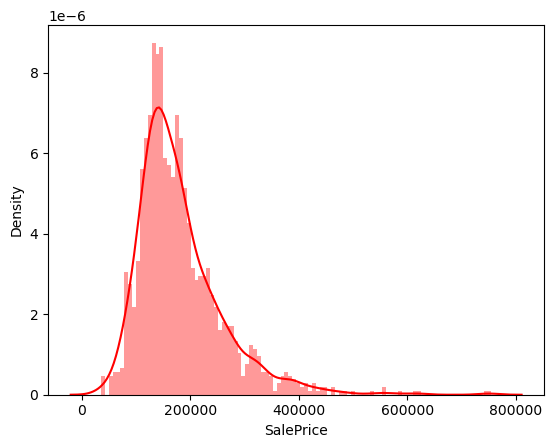

In [13]:
print(df['SalePrice'].describe())
sns.distplot(df['SalePrice'], hist_kws={'alpha': 0.4}, bins=100, color='r' )
plt.show()

-  Data seperation using Dtypes

In [14]:
df.dtypes.unique()


array([dtype('int64'), dtype('O'), dtype('float64')], dtype=object)

In [15]:
df_num=df.select_dtypes(include=['int64', 'float64'])

In [16]:
df_num.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,150,856,856,854,0,1710,1,0,2,1,3,1,8,0,2003.0,2,548,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,284,1262,1262,0,0,1262,0,1,2,0,3,1,6,1,1976.0,2,460,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,434,920,920,866,0,1786,1,0,2,1,3,1,6,1,2001.0,2,608,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,540,756,961,756,0,1717,1,0,1,0,3,1,7,1,1998.0,3,642,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,490,1145,1145,1053,0,2198,1,0,2,1,4,1,9,1,2000.0,3,836,192,84,0,0,0,0,0,12,2008,250000


In [17]:
df_cat=df.select_dtypes('O')
df_cat.head(2)

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


- Fill missing values 

In [18]:
df.isnull().sum()

MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
Street             0
LotShape           0
LandContour        0
Utilities          0
LotConfig          0
LandSlope          0
Neighborhood       0
Condition1         0
Condition2         0
BldgType           0
HouseStyle         0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
RoofStyle          0
RoofMatl           0
Exterior1st        0
Exterior2nd        0
MasVnrType         8
MasVnrArea         8
ExterQual          0
ExterCond          0
Foundation         0
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinSF1         0
BsmtFinType2      38
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
Heating            0
HeatingQC          0
CentralAir         0
Electrical         1
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath     

In [19]:
backup=df.copy()

In [20]:
filled_df = df.fillna(df.mode().iloc[0])

In [21]:
filled_df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd

- will work on numeric columns


In [22]:
df_num.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 0 to 1459
Data columns (total 37 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     1460 non-null   int64  
 1   LotFrontage    1201 non-null   float64
 2   LotArea        1460 non-null   int64  
 3   OverallQual    1460 non-null   int64  
 4   OverallCond    1460 non-null   int64  
 5   YearBuilt      1460 non-null   int64  
 6   YearRemodAdd   1460 non-null   int64  
 7   MasVnrArea     1452 non-null   float64
 8   BsmtFinSF1     1460 non-null   int64  
 9   BsmtFinSF2     1460 non-null   int64  
 10  BsmtUnfSF      1460 non-null   int64  
 11  TotalBsmtSF    1460 non-null   int64  
 12  1stFlrSF       1460 non-null   int64  
 13  2ndFlrSF       1460 non-null   int64  
 14  LowQualFinSF   1460 non-null   int64  
 15  GrLivArea      1460 non-null   int64  
 16  BsmtFullBath   1460 non-null   int64  
 17  BsmtHalfBath   1460 non-null   int64  
 18  FullBath

In [23]:
df_num.corr()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
MSSubClass,1.000000,-0.386347,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.022936,-0.069836,-0.065649,-0.140759,-0.238518,-0.251758,0.307886,0.046474,0.074853,0.003491,-0.002333,0.131608,0.177354,-0.023438,0.281721,0.040380,-0.045569,0.085072,-0.040110,-0.098672,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.386347,1.000000,0.426095,0.251646,-0.059213,0.123349,0.088866,0.193458,0.233633,0.049900,0.132644,0.392075,0.457181,0.080177,0.038469,0.402797,0.100949,-0.007234,0.198769,0.053532,0.263170,-0.006069,0.352096,0.266639,0.070250,0.285691,0.344997,0.088521,0.151972,0.010700,0.070029,0.041383,0.206167,0.003368,0.011200,0.007450,0.351799
LotArea,-0.139781,0.426095,1.000000,0.105806,-0.005636,0.014228,0.013788,0.104160,0.214103,0.111170,-0.002618,0.260833,0.299475,0.050986,0.004779,0.263116,0.158155,0.048046,0.126031,0.014259,0.119690,-0.017784,0.190015,0.271364,-0.024947,0.154871,0.180403,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,0.032628,0.251646,0.105806,1.000000,-0.091932,0.572323,0.550684,0.411876,0.239666,-0.059119,0.308159,0.537808,0.476224,0.295493,-0.030429,0.593007,0.111098,-0.040150,0.550600,0.273458,0.101676,-0.183882,0.427452,0.396765,0.547766,0.600671,0.562022,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,-0.059316,-0.059213,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.128101,-0.046231,0.040229,-0.136841,-0.171098,-0.144203,0.028942,0.025494,-0.079686,-0.054942,0.117821,-0.194149,-0.060769,0.012980,-0.087001,-0.057583,-0.023820,-0.324297,-0.185758,-0.151521,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,0.027850,0.123349,0.014228,0.572323,-0.375983,1.000000,0.592855,0.315707,0.249503,-0.049107,0.149040,0.391452,0.281986,0.010308,-0.183784,0.199010,0.187599,-0.038162,0.468271,0.242656,-0.070651,-0.174800,0.095589,0.147716,0.825667,0.537850,0.478954,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,0.040581,0.088866,0.013788,0.550684,0.073741,0.592855,1.000000,0.179618,0.128451,-0.067759,0.181133,0.291066,0.240379,0.140024,-0.062419,0.287389,0.119470,-0.012337,0.439046,0.183331,-0.040581,-0.149598,0.191740,0.112581,0.642277,0.420622,0.371600,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,0.022936,0.193458,0.104160,0.411876,-0.128101,0.315707,0.179618,1.000000,0.264736,-0.072319,0.114442,0.363936,0.344501,0.174561,-0.069071,0.390857,0.085310,0.026673,0.276833,0.201444,0.102821,-0.037610,0.280682,0.249070,0.252691,0.364204,0.373066,0.159718,0.125703,-0.110204,0.018796,0.061466,0.011723,-0.029815,-0.005965,-0.008201,0.477493
BsmtFinSF1,-0.069836,0.233633,0.214103,0.239666,-0.046231,0.249503,0.128451,0.264736,1.000000,-0.050117,-0.495251,0.522396,0.445863,-0.137079,-0.064503,0.208171,0.649212,0.067418,0.058543,0.004262,-0.107355,-0.081007,0.044316,0.260011,0.153484,0.224054,0.296970,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420
BsmtFinSF2,-0.065649,0.049900,0.111170,-0.059119,0.040229,-0.049107,-0.067759,-0.072319,-0.050117,1.000000,-0.209294,0.104810,0.097117,-0.099260,0.014807,-0.009640,0.158678,0.070948,-0.076444,-0.032148,-0.015728,-0.040751,-0.035227,0.046921,-0.088011,-0.038264,-0.018227,0.067898,0.003093,0.036543,-0.029993,0.088871,0.041709,0.004940,-0.015211,0.031706,-0.011378


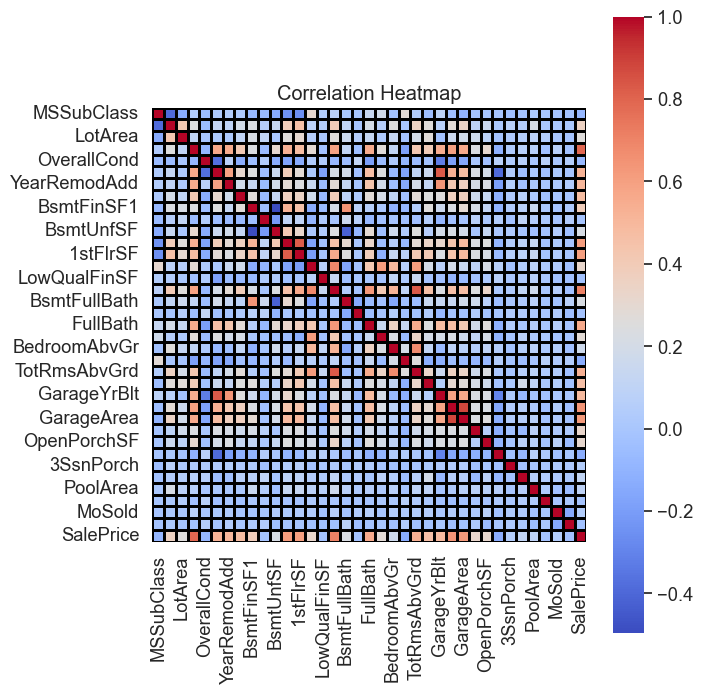

In [24]:
cormat=df_num.corr()
paper=plt.figure(figsize=(7,8))
sns.set(font_scale=1.2)
sns.heatmap(cormat, cmap="coolwarm", cbar=True, linewidths=1, linecolor='black', vmax=1, square=True)
plt.title("Correlation Heatmap")
plt.show()

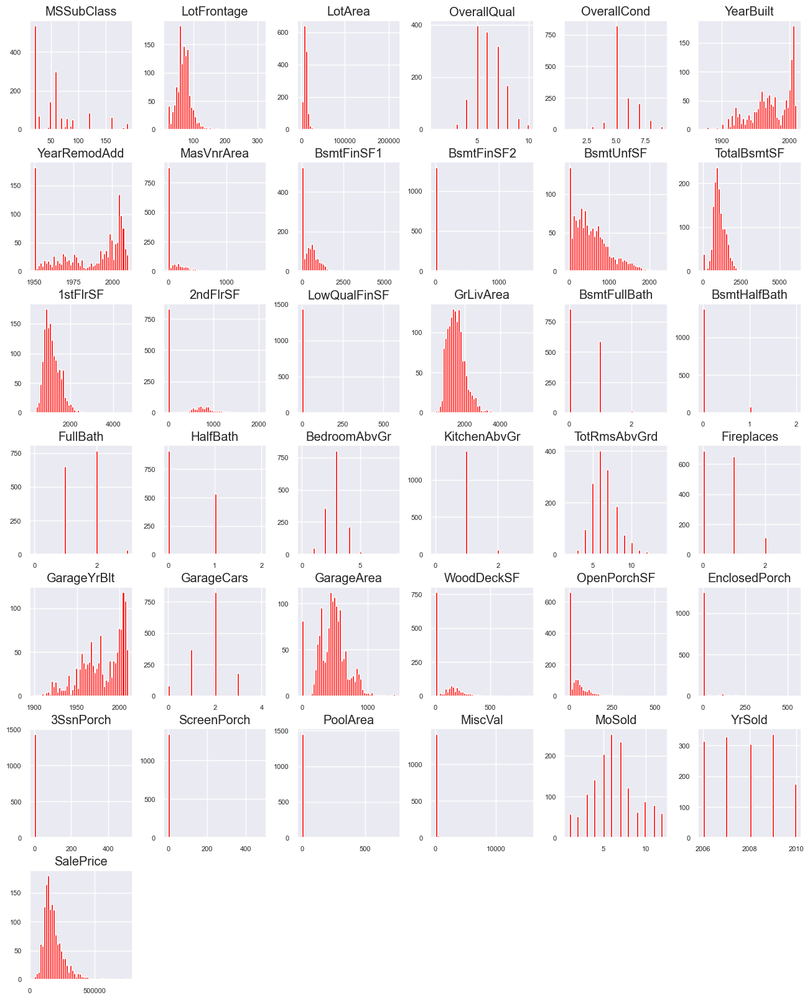

In [25]:
df_num.hist(figsize=(16, 20), bins=50, xlabelsize=8, ylabelsize=8, color='Red')
plt.show()

In [26]:
df_num_corr=df_num.corr()['SalePrice'][:-1]
best_num_features=df_num_corr[abs(df_num_corr)>0.4].sort_values(ascending=False)

In [27]:
print(f"There Are {len(best_num_features)} Best Features with SalePrice \n\n{best_num_features}")

There Are 13 Best Features with SalePrice 

OverallQual     0.790982
GrLivArea       0.708624
GarageCars      0.640409
GarageArea      0.623431
TotalBsmtSF     0.613581
1stFlrSF        0.605852
FullBath        0.560664
TotRmsAbvGrd    0.533723
YearBuilt       0.522897
YearRemodAdd    0.507101
GarageYrBlt     0.486362
MasVnrArea      0.477493
Fireplaces      0.466929
Name: SalePrice, dtype: float64


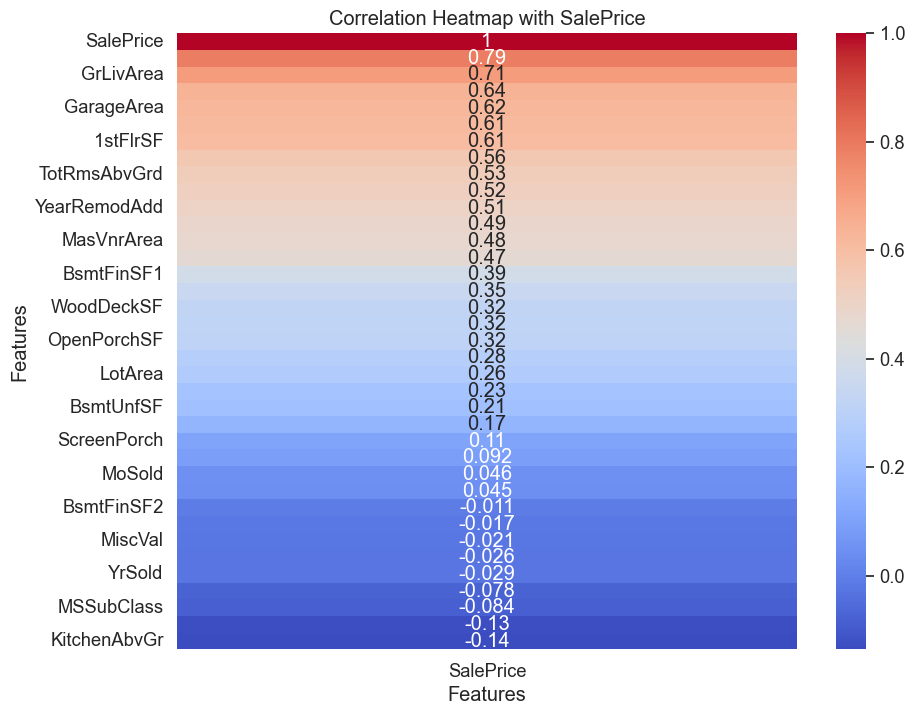

In [28]:
correlation_matrix=df_num.corr()
salespricecorr=correlation_matrix["SalePrice"].sort_values(ascending=False)
salepricecorr_df=pd.DataFrame(salespricecorr)         
plt.figure(figsize=(10, 8)) 
sns.heatmap(salepricecorr_df, annot=True, cmap="coolwarm", cbar=True)
plt.xlabel('Features')
plt.ylabel('Features')
plt.title('Correlation Heatmap with SalePrice')
plt.show()

In [29]:
best_num_features.index

Index(['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF',
       '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd',
       'GarageYrBlt', 'MasVnrArea', 'Fireplaces'],
      dtype='object')

In [30]:
best_num_featurelist= ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF',
       '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd',
       'GarageYrBlt', 'MasVnrArea', 'Fireplaces','SalePrice']
df_best_num_feature=df.loc[:,best_num_featurelist].copy()

In [31]:
df_best_num_feature

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd,GarageYrBlt,MasVnrArea,Fireplaces,SalePrice
0,7,1710,2,548,856,856,2,8,2003,2003,2003.0,196.0,0,208500
1,6,1262,2,460,1262,1262,2,6,1976,1976,1976.0,0.0,1,181500
2,7,1786,2,608,920,920,2,6,2001,2002,2001.0,162.0,1,223500
3,7,1717,3,642,756,961,1,7,1915,1970,1998.0,0.0,1,140000
4,8,2198,3,836,1145,1145,2,9,2000,2000,2000.0,350.0,1,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,6,1647,2,460,953,953,2,7,1999,2000,1999.0,0.0,1,175000
1456,6,2073,2,500,1542,2073,2,7,1978,1988,1978.0,119.0,2,210000
1457,7,2340,1,252,1152,1188,2,9,1941,2006,1941.0,0.0,2,266500
1458,5,1078,1,240,1078,1078,1,5,1950,1996,1950.0,0.0,0,142125


## Feature to Feature Relationship

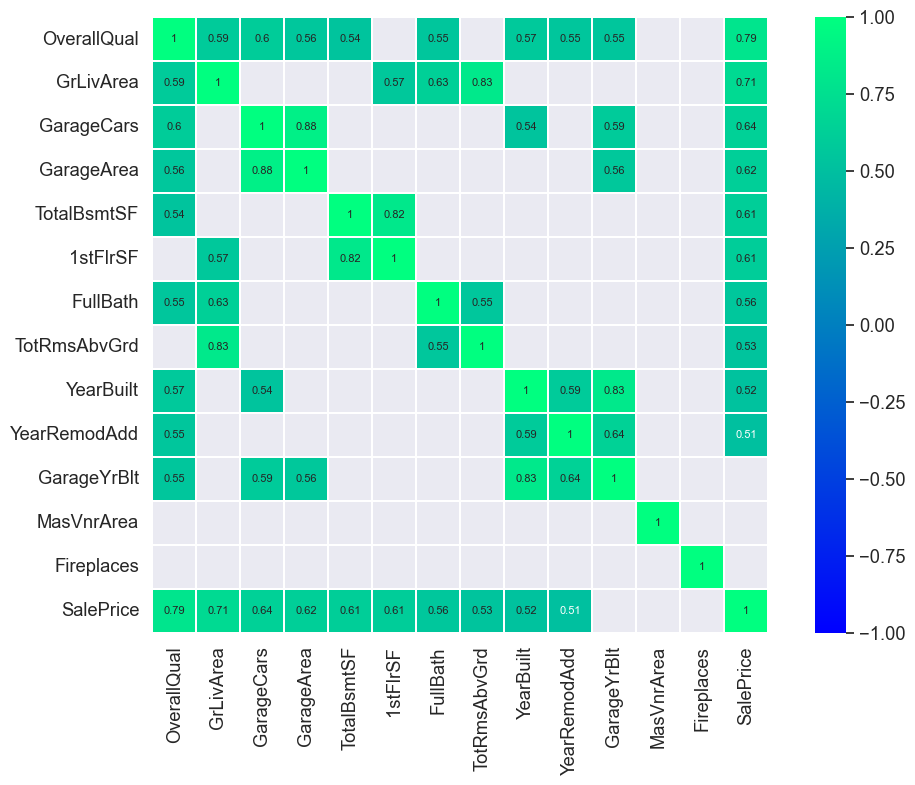

In [32]:
corr=df_best_num_feature.corr()
paper=plt.figure(figsize=(12,8))
sns.heatmap(corr[(corr>=0.5) |(corr<= -0.4)] ,
            cmap='winter', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True)

plt.show()

In [33]:
df_best_num_feature = df_best_num_feature.drop(['GarageYrBlt', 'MasVnrArea', 'Fireplaces'], axis=1)

In [34]:
df_best_num_feature.columns

Index(['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF',
       '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd',
       'SalePrice'],
      dtype='object')

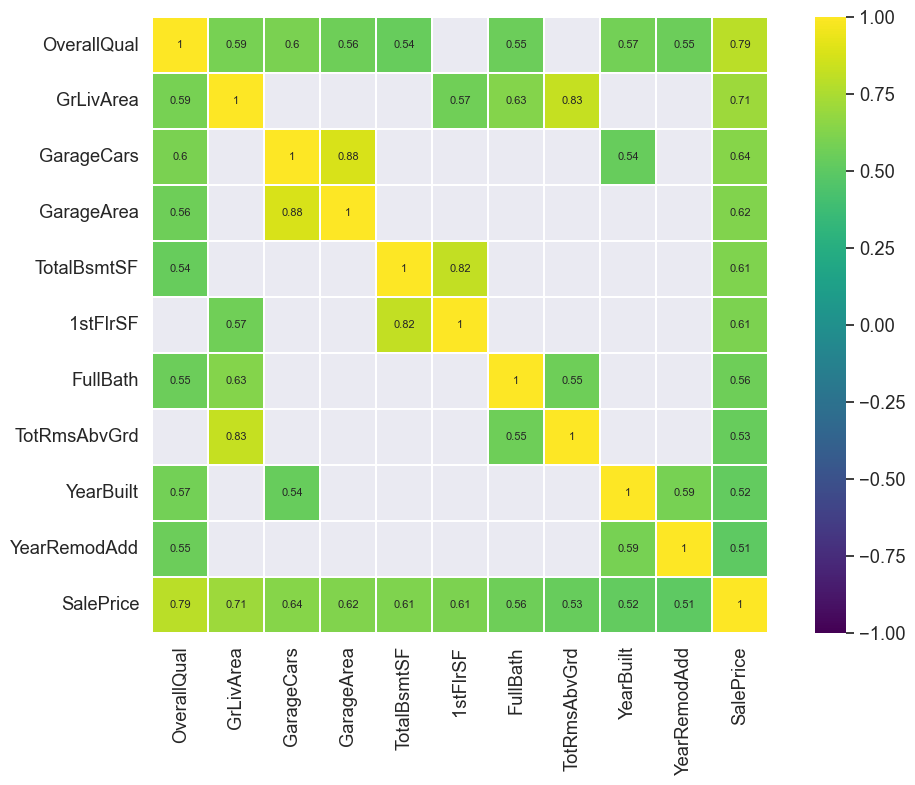

In [35]:
corr=df_best_num_feature.corr()
paper=plt.figure(figsize=(12,8))
sns.heatmap(corr[(corr>=0.5) |(corr<= -0.4)] ,
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True)

plt.show()

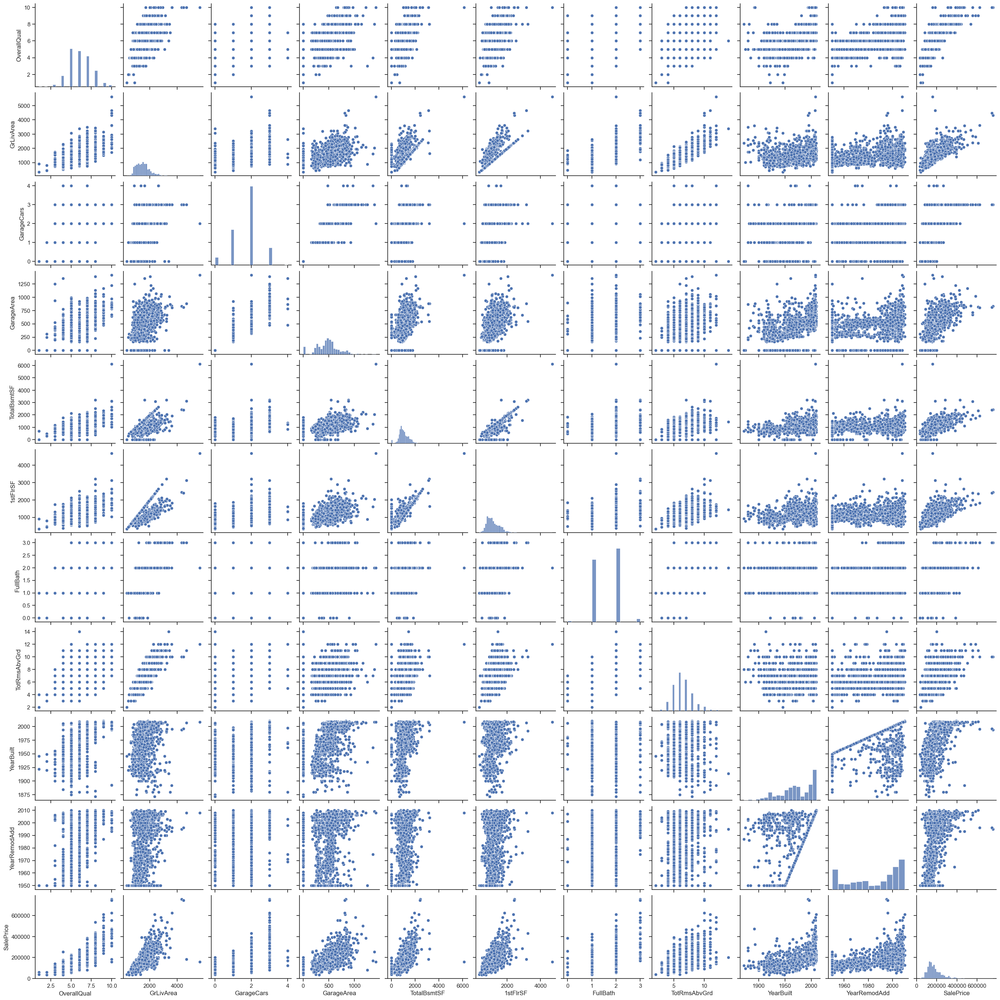

In [36]:
sns.set(style="ticks")  
sns.pairplot(df_best_num_feature)

plt.show()


In [37]:
df_best_num_feature.isnull().sum()

OverallQual     0
GrLivArea       0
GarageCars      0
GarageArea      0
TotalBsmtSF     0
1stFlrSF        0
FullBath        0
TotRmsAbvGrd    0
YearBuilt       0
YearRemodAdd    0
SalePrice       0
dtype: int64

## Working on Categorical Data

In [38]:
df_cat.head()

,MSZoning,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinType2,Heating,HeatingQC,CentralAir,Electrical,KitchenQual,Functional,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,SaleType,SaleCondition
0,RL,Pave,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,No,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
1,RL,Pave,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,Gable,CompShg,MetalSd,MetalSd,None,TA,TA,CBlock,Gd,TA,Gd,ALQ,Unf,GasA,Ex,Y,SBrkr,TA,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
2,RL,Pave,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Mn,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal
3,RL,Pave,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,Gable,CompShg,Wd Sdng,Wd Shng,None,TA,TA,BrkTil,TA,Gd,No,ALQ,Unf,GasA,Gd,Y,SBrkr,Gd,Typ,Detchd,Unf,TA,TA,Y,WD,Abnorml
4,RL,Pave,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,Gable,CompShg,VinylSd,VinylSd,BrkFace,Gd,TA,PConc,Gd,TA,Av,GLQ,Unf,GasA,Ex,Y,SBrkr,Gd,Typ,Attchd,RFn,TA,TA,Y,WD,Normal


In [39]:
df_cat.nunique()

MSZoning          5
Street            2
LotShape          4
LandContour       4
Utilities         2
LotConfig         5
LandSlope         3
Neighborhood     25
Condition1        9
Condition2        8
BldgType          5
HouseStyle        8
RoofStyle         6
RoofMatl          8
Exterior1st      15
Exterior2nd      16
MasVnrType        4
ExterQual         4
ExterCond         5
Foundation        6
BsmtQual          4
BsmtCond          4
BsmtExposure      4
BsmtFinType1      6
BsmtFinType2      6
Heating           6
HeatingQC         5
CentralAir        2
Electrical        5
KitchenQual       4
Functional        7
GarageType        6
GarageFinish      3
GarageQual        5
GarageCond        5
PavedDrive        3
SaleType          9
SaleCondition     6
dtype: int64

In [40]:
df_cat['Neighborhood'].value_counts()

NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64

- This column contains various neighborhood names, which makes it a categorical variable. Categorical variables consist of distinct categories (in this case, neighborhood names) without any inherent order.
- To manage the potential challenge of high dimensionality, we will opt to remove this column from our analysis

In [41]:
import plotly.express as px


fig = px.box(df, x='Neighborhood', y=df['SalePrice'])

fig.update_layout(
    title='Sale Price Distribution by Neighborhood',
    xaxis=dict(title='Neighborhood'),
    yaxis=dict(title='Sale Price'),
    xaxis_tickangle=-45, 
    width=800, 
    height=400, 
)

fig.show()


In [42]:
df_cat.drop(columns=['Neighborhood'], inplace = True)

In [43]:
df_cat.nunique()

MSZoning          5
Street            2
LotShape          4
LandContour       4
Utilities         2
LotConfig         5
LandSlope         3
Condition1        9
Condition2        8
BldgType          5
HouseStyle        8
RoofStyle         6
RoofMatl          8
Exterior1st      15
Exterior2nd      16
MasVnrType        4
ExterQual         4
ExterCond         5
Foundation        6
BsmtQual          4
BsmtCond          4
BsmtExposure      4
BsmtFinType1      6
BsmtFinType2      6
Heating           6
HeatingQC         5
CentralAir        2
Electrical        5
KitchenQual       4
Functional        7
GarageType        6
GarageFinish      3
GarageQual        5
GarageCond        5
PavedDrive        3
SaleType          9
SaleCondition     6
dtype: int64

In [44]:
df_cat['Exterior1st'].value_counts()

VinylSd    515
HdBoard    222
MetalSd    220
Wd Sdng    206
Plywood    108
CemntBd     61
BrkFace     50
WdShing     26
Stucco      25
AsbShng     20
BrkComm      2
Stone        2
AsphShn      1
ImStucc      1
CBlock       1
Name: Exterior1st, dtype: int64

In [45]:
df_cat['Exterior2nd'].value_counts()

VinylSd    504
MetalSd    214
HdBoard    207
Wd Sdng    197
Plywood    142
CmentBd     60
Wd Shng     38
Stucco      26
BrkFace     25
AsbShng     20
ImStucc     10
Brk Cmn      7
Stone        5
AsphShn      3
Other        1
CBlock       1
Name: Exterior2nd, dtype: int64

In [46]:

fig = px.histogram(df_cat, x='Exterior2nd', y=df['SalePrice'])

fig.update_layout(
    title='Sale Price Distribution by Exterior2nd',
    xaxis=dict(title='Exterior2nd'),
    yaxis=dict(title='Sale Price'),
    xaxis_tickangle=-45, 
    width=800, 
    height=400, 
)

fig.show()

In [47]:
fig = px.histogram(df_cat, x='Exterior1st', y=df['SalePrice'])

fig.update_layout(
    title='Sale Price Distribution by Exterior1st',
    xaxis=dict(title='Exterior1st'),
    yaxis=dict(title='Sale Price'),
    xaxis_tickangle=-45, 
    width=800, 
    height=400, 
)

fig.show()

In [48]:
for material in df_cat['Exterior1st'].unique():
    df_cat[f'Has_{material}_Exterior'] = (df_cat['Exterior1st'] == material) | (df_cat['Exterior2nd'] == material)

df_cat.drop(['Exterior1st', 'Exterior2nd'], axis=1, inplace=True)

In [49]:
for column in df_cat.columns:
    if df_cat[column].nunique() == 2:
        print(df_cat[column].value_counts())


Pave    1454
Grvl       6
Name: Street, dtype: int64
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
Y    1365
N      95
Name: CentralAir, dtype: int64
False    943
True     517
Name: Has_VinylSd_Exterior, dtype: int64
False    1238
True      222
Name: Has_MetalSd_Exterior, dtype: int64
False    1234
True      226
Name: Has_Wd Sdng_Exterior, dtype: int64
False    1224
True      236
Name: Has_HdBoard_Exterior, dtype: int64
False    1409
True       51
Name: Has_BrkFace_Exterior, dtype: int64
False    1434
True       26
Name: Has_WdShing_Exterior, dtype: int64
False    1399
True       61
Name: Has_CemntBd_Exterior, dtype: int64
False    1306
True      154
Name: Has_Plywood_Exterior, dtype: int64
False    1437
True       23
Name: Has_AsbShng_Exterior, dtype: int64
False    1429
True       31
Name: Has_Stucco_Exterior, dtype: int64
False    1458
True        2
Name: Has_BrkComm_Exterior, dtype: int64
False    1457
True        3
Name: Has_AsphShn_Exterior, dtype: int64
False    14

In [50]:
# Create an empty list to store column names
selected_columns = []

# Loop through the categorical columns
for column in df_cat.columns:
    # Check if the column is binary (unique values equal to 2)
    if df_cat[column].nunique() == 2:
        # Print the value counts for binary columns
        value_counts = df_cat[column].value_counts()
        print(f"Column: {column}")
        print(value_counts)
        
        # Check if the value count of the most common category is less than 50
        if value_counts.iloc[1] < 50:
            selected_columns.append(column)

# Print the selected columns
print("Selected Columns:", selected_columns)

Column: Street
Pave    1454
Grvl       6
Name: Street, dtype: int64
Column: Utilities
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
Column: CentralAir
Y    1365
N      95
Name: CentralAir, dtype: int64
Column: Has_VinylSd_Exterior
False    943
True     517
Name: Has_VinylSd_Exterior, dtype: int64
Column: Has_MetalSd_Exterior
False    1238
True      222
Name: Has_MetalSd_Exterior, dtype: int64
Column: Has_Wd Sdng_Exterior
False    1234
True      226
Name: Has_Wd Sdng_Exterior, dtype: int64
Column: Has_HdBoard_Exterior
False    1224
True      236
Name: Has_HdBoard_Exterior, dtype: int64
Column: Has_BrkFace_Exterior
False    1409
True       51
Name: Has_BrkFace_Exterior, dtype: int64
Column: Has_WdShing_Exterior
False    1434
True       26
Name: Has_WdShing_Exterior, dtype: int64
Column: Has_CemntBd_Exterior
False    1399
True       61
Name: Has_CemntBd_Exterior, dtype: int64
Column: Has_Plywood_Exterior
False    1306
True      154
Name: Has_Plywood_Exterior, dtype: int64
Co

In [51]:
for i in df_cat[selected_columns]:
    print(df_cat[i].value_counts())
    

Pave    1454
Grvl       6
Name: Street, dtype: int64
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
False    1434
True       26
Name: Has_WdShing_Exterior, dtype: int64
False    1437
True       23
Name: Has_AsbShng_Exterior, dtype: int64
False    1429
True       31
Name: Has_Stucco_Exterior, dtype: int64
False    1458
True        2
Name: Has_BrkComm_Exterior, dtype: int64
False    1457
True        3
Name: Has_AsphShn_Exterior, dtype: int64
False    1454
True        6
Name: Has_Stone_Exterior, dtype: int64
False    1450
True       10
Name: Has_ImStucc_Exterior, dtype: int64
False    1459
True        1
Name: Has_CBlock_Exterior, dtype: int64


- will drop Selected_columns where most of the values are false 

In [52]:
df_cat.drop(columns=(selected_columns), inplace = True)

In [53]:
df_cat.shape

(1460, 40)

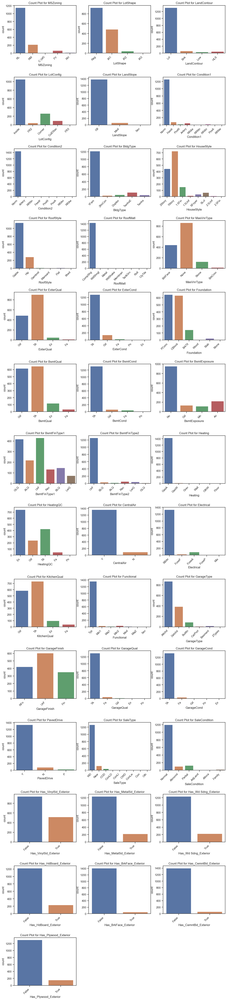

In [54]:

# Assuming you have a DataFrame df_cat with 40 categorical columns

# Calculate the number of rows needed
num_rows = (len(df_cat.columns) + 2) // 3  # Ceiling division to ensure enough rows

# Create subplots
fig, axes = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))
plt.subplots_adjust(hspace=0.5)  # Adjust vertical spacing

# Loop through categorical columns and create count plots
for i, column in enumerate(df_cat.columns):
    row_idx = i // 3
    col_idx = i % 3
    ax = axes[row_idx, col_idx]
    
    sns.countplot(data=df_cat, x=column, ax=ax)
    ax.set_title(f'Count Plot for {column}')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')

# Remove any empty subplots
for i in range(len(df_cat.columns), num_rows * 3):
    fig.delaxes(axes.flatten()[i])

plt.show()

    

In [55]:
df_cat.isnull().sum()

MSZoning                 0
LotShape                 0
LandContour              0
LotConfig                0
LandSlope                0
Condition1               0
Condition2               0
BldgType                 0
HouseStyle               0
RoofStyle                0
RoofMatl                 0
MasVnrType               8
ExterQual                0
ExterCond                0
Foundation               0
BsmtQual                37
BsmtCond                37
BsmtExposure            38
BsmtFinType1            37
BsmtFinType2            38
Heating                  0
HeatingQC                0
CentralAir               0
Electrical               1
KitchenQual              0
Functional               0
GarageType              81
GarageFinish            81
GarageQual              81
GarageCond              81
PavedDrive               0
SaleType                 0
SaleCondition            0
Has_VinylSd_Exterior     0
Has_MetalSd_Exterior     0
Has_Wd Sdng_Exterior     0
Has_HdBoard_Exterior     0
H

In [56]:
cat_filled_df = df_cat.fillna(df_cat.mode().iloc[0])

In [57]:
cat_filled_df.isnull().sum()

MSZoning                0
LotShape                0
LandContour             0
LotConfig               0
LandSlope               0
Condition1              0
Condition2              0
BldgType                0
HouseStyle              0
RoofStyle               0
RoofMatl                0
MasVnrType              0
ExterQual               0
ExterCond               0
Foundation              0
BsmtQual                0
BsmtCond                0
BsmtExposure            0
BsmtFinType1            0
BsmtFinType2            0
Heating                 0
HeatingQC               0
CentralAir              0
Electrical              0
KitchenQual             0
Functional              0
GarageType              0
GarageFinish            0
GarageQual              0
GarageCond              0
PavedDrive              0
SaleType                0
SaleCondition           0
Has_VinylSd_Exterior    0
Has_MetalSd_Exterior    0
Has_Wd Sdng_Exterior    0
Has_HdBoard_Exterior    0
Has_BrkFace_Exterior    0
Has_CemntBd_

In [58]:

# Assuming df_categorical is your DataFrame with categorical columns
threshold = 0.70  # Define the threshold (70% in this case)

# Calculate the percentage of the most frequent category in each column
category_counts = df_cat.apply(lambda col: col.value_counts().max() / len(col))

# Filter columns where the most frequent category exceeds the threshold
unrelevant_columns = category_counts[category_counts > threshold].index
relevant_columns = category_counts[category_counts < threshold].index

In [59]:
print(df_cat[unrelevant_columns].shape)
print(df_cat[relevant_columns].shape)
print(f"Numerical {df_best_num_feature.shape}")


(1460, 27)
(1460, 13)
Numerical (1460, 11)


In [60]:
unrelevant_col= df_cat[unrelevant_columns]


In [61]:
relevant_columns=df_cat[relevant_columns]

In [62]:
for col in unrelevant_col:
    print(unrelevant_col[col].value_counts())

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64
Norm      1260
Feedr       81
Artery      48
RRAn        26
PosN        19
RRAe        11
PosA         8
RRNn         5
RRNe         2
Name: Condition1, dtype: int64
Norm      1445
Feedr        6
Artery       2
RRNn         2
PosN         2
PosA         1
RRAn         1
RRAe         1
Name: Condition2, dtype: int64
1Fam      1220
TwnhsE     114
Duplex      52
Twnhs       43
2fmCon      31
Name: BldgType, dtype: int64
Gable      1141
Hip         286
Flat         13
Gambrel      11
Mansard       7
Shed          2
Name: RoofStyle, dtype: int64
CompShg    1434
Tar&Grv      11
WdShngl       6
WdShake       5
Metal         1
Membran 

27 9


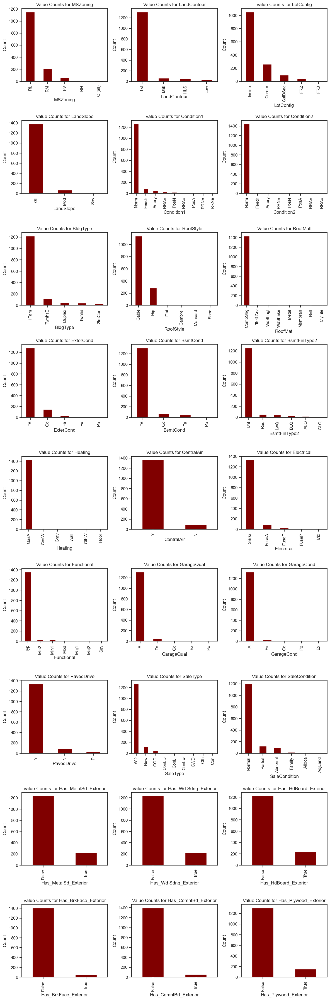

In [63]:
num_plots=len(unrelevant_col.columns)
num_plots_per_row=3
num_row=(num_plots+num_plots_per_row-1)//3
print(num_plots, num_row)

#create Subplots

fig ,axes = plt.subplots(num_row, num_plots_per_row, figsize=(12,4 * num_row ))
axes = axes.flatten()

for i, column in enumerate(unrelevant_col):
    counts = df_cat[column].value_counts()
    
    # Create a bar plot on the current subplot
    counts.plot(kind='bar', color='Maroon', ax=axes[i])
    
    # Set labels and title
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Count')
    axes[i].set_title(f'Value Counts for {column}')
    
for i in range(num_plots, num_row * num_plots_per_row):
    fig.delaxes(axes[i])
    
fig.tight_layout()
plt.show()

In [64]:
for col in relevant_columns:
    print(relevant_columns[col].value_counts())

Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64
None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64
TA    906
Gd    488
Ex     52
Fa     14
Name: ExterQual, dtype: int64
PConc     647
CBlock    634
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: Foundation, dtype: int64
TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64
No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64
Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64
Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: HeatingQC, dtype: int64
TA    735
Gd    586
Ex    100
Fa     39
Name: KitchenQual, dtype: int64
Attchd     870
Detchd     387
BuiltIn     88
Basment     19
CarPort      9
2Types       6
Name: GarageType, dtype: 

13 5


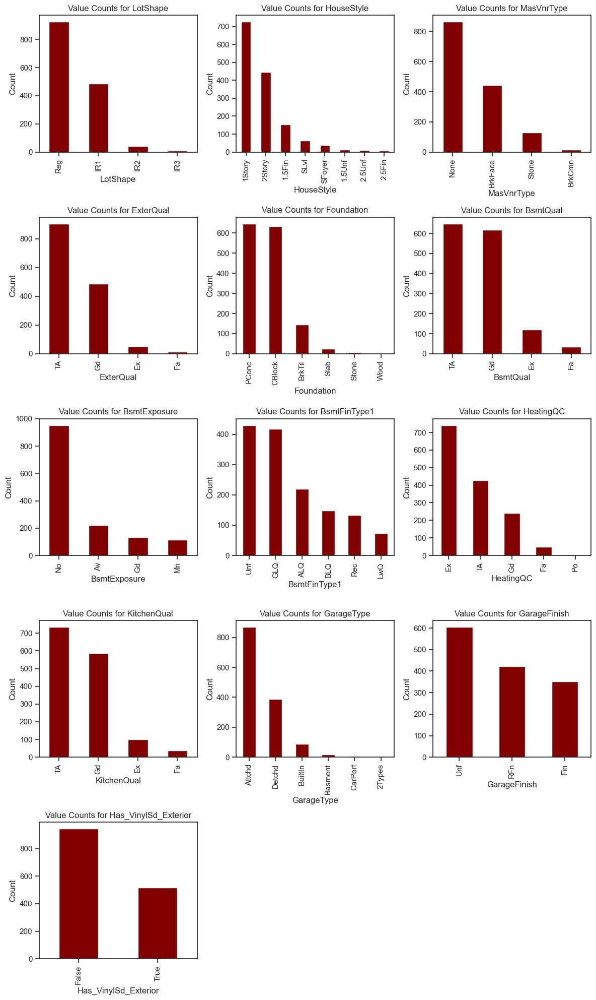

In [65]:
num_plots=13
num_plots_per_row=3
num_row=(num_plots+num_plots_per_row-1)//3
print(num_plots, num_row)

#create Subplots

fig ,axes = plt.subplots(num_row, num_plots_per_row, figsize=(12,4 * num_row ))
axes = axes.flatten()

for i, column in enumerate(relevant_columns):
    counts = df_cat[column].value_counts()
    
    # Create a bar plot on the current subplot
    counts.plot(kind='bar', color='Maroon', ax=axes[i])
    
    # Set labels and title
    axes[i].set_xlabel(column)
    axes[i].set_ylabel('Count')
    axes[i].set_title(f'Value Counts for {column}')
    
for i in range(num_plots, num_row * num_plots_per_row):
    fig.delaxes(axes[i])
    
fig.tight_layout()
plt.show()

<div style="text-align: left;">
    <h2 style="font-size: 24px; color: #336699;">Feature Engineering</h2>
</div>

Feature engineering is the art of creating new features from existing ones or selecting the most relevant features for model training. In this section, we will engineer meaningful features to improve our model's performance.


In [66]:


df1 = pd.concat([relevant_columns, df_best_num_feature],axis=1)



In [67]:
df1.head()

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,Has_VinylSd_Exterior,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd,SalePrice
0,Reg,2Story,BrkFace,Gd,PConc,Gd,No,GLQ,Ex,Gd,Attchd,RFn,True,7,1710,2,548,856,856,2,8,2003,2003,208500
1,Reg,1Story,None,TA,CBlock,Gd,Gd,ALQ,Ex,TA,Attchd,RFn,False,6,1262,2,460,1262,1262,2,6,1976,1976,181500
2,IR1,2Story,BrkFace,Gd,PConc,Gd,Mn,GLQ,Ex,Gd,Attchd,RFn,True,7,1786,2,608,920,920,2,6,2001,2002,223500
3,IR1,2Story,None,TA,BrkTil,TA,No,ALQ,Gd,Gd,Detchd,Unf,False,7,1717,3,642,756,961,1,7,1915,1970,140000
4,IR1,2Story,BrkFace,Gd,PConc,Gd,Av,GLQ,Ex,Gd,Attchd,RFn,True,8,2198,3,836,1145,1145,2,9,2000,2000,250000


In [68]:
fig =px.box(df1, x='LotShape', y='SalePrice')
fig.update_layout(
    title='Sale Price Distribution by LotShape',
    xaxis=dict(title='LotShape'),
    yaxis=dict(title='Sale Price'),
    xaxis_tickangle=-45, 
    width=800, 
    height=400, 
)
fig.show()

In [69]:

for column in df1.columns:
    if column == 'GrLivArea':
        break
    fig = px.box(df1, x=df1[column], y='SalePrice')
    fig.update_layout(
        title=f'Sale Price Distribution by {column}',
        xaxis=dict(title=column),
        yaxis=dict(title='Sale Price'),
        xaxis_tickangle=-45,
        width=800,
        height=400,
    )
    fig.show()
plt.tight_layout()
plt.show()

<Figure size 640x480 with 0 Axes>

In [70]:
Num_col = ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd', 'SalePrice']

for column in df1.columns:
    if column in Num_col:
        fig = px.scatter(df1, x=df1[column], y='SalePrice')
        fig.update_layout(
            title=f'Sale Price Distribution by {column}',
            xaxis=dict(title=column),
            yaxis=dict(title='Sale Price'),
            xaxis_tickangle=-45,
            width=800,
            height=400,
        )
        fig.show()

plt.tight_layout()
plt.show()


<Figure size 640x480 with 0 Axes>

In [71]:
for col in df1:
    print(col)
    print(df1[col].value_counts())

LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
HouseStyle
1Story    726
2Story    445
1.5Fin    154
SLvl       65
SFoyer     37
1.5Unf     14
2.5Unf     11
2.5Fin      8
Name: HouseStyle, dtype: int64
MasVnrType
None       864
BrkFace    445
Stone      128
BrkCmn      15
Name: MasVnrType, dtype: int64
ExterQual
TA    906
Gd    488
Ex     52
Fa     14
Name: ExterQual, dtype: int64
Foundation
PConc     647
CBlock    634
BrkTil    146
Slab       24
Stone       6
Wood        3
Name: Foundation, dtype: int64
BsmtQual
TA    649
Gd    618
Ex    121
Fa     35
Name: BsmtQual, dtype: int64
BsmtExposure
No    953
Av    221
Gd    134
Mn    114
Name: BsmtExposure, dtype: int64
BsmtFinType1
Unf    430
GLQ    418
ALQ    220
BLQ    148
Rec    133
LwQ     74
Name: BsmtFinType1, dtype: int64
HeatingQC
Ex    741
TA    428
Gd    241
Fa     49
Po      1
Name: HeatingQC, dtype: int64
KitchenQual
TA    735
Gd    586
Ex    100
Fa     39
Name: KitchenQual, dtype: int64
Garage

In [72]:

check = ['None', 'BrkFace']
df1['MasVnrType'] = df1['MasVnrType'].apply(lambda x: x if x in check else 'others')


In [73]:

check = ['None', 'BrkFace']
df1['MasVnrType'] = df1['MasVnrType'].apply(lambda x: x if x in check else 'others')


In [74]:
check = ['Reg', 'IR1']
df1['LotShape'] = df1['LotShape'].apply(lambda x: x if x in check else 'others')


In [75]:
check = ['1Story', '2Story','1.5Fin']
df1['HouseStyle'] = df1['HouseStyle'].apply(lambda x: x if x in check else 'others')


In [76]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 0 to 1459
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   LotShape              1460 non-null   object
 1   HouseStyle            1460 non-null   object
 2   MasVnrType            1460 non-null   object
 3   ExterQual             1460 non-null   object
 4   Foundation            1460 non-null   object
 5   BsmtQual              1423 non-null   object
 6   BsmtExposure          1422 non-null   object
 7   BsmtFinType1          1423 non-null   object
 8   HeatingQC             1460 non-null   object
 9   KitchenQual           1460 non-null   object
 10  GarageType            1379 non-null   object
 11  GarageFinish          1379 non-null   object
 12  Has_VinylSd_Exterior  1460 non-null   bool  
 13  OverallQual           1460 non-null   int64 
 14  GrLivArea             1460 non-null   int64 
 15  GarageCars            1460 non-null   

## Ordinal

In [77]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder

In [78]:
df1 = df1.fillna(df1.mode().iloc[0])

In [79]:
order_qual = ["Fa", "TA", "Gd", "Ex"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["ExterQual"]])

df1["ExterQual"]=pd.DataFrame(qual_label.transform(df1[["ExterQual"]]))

In [80]:
order_qual = ["Fa", "TA", "Gd", "Ex"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["BsmtQual"]])

df1["BsmtQual"]=pd.DataFrame(qual_label.transform(df1[["BsmtQual"]]))

In [81]:
order_qual = ["Reg", "IR1", "others"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["LotShape"]])

df1["LotShape"]=pd.DataFrame(qual_label.transform(df1[["LotShape"]]))

In [82]:
order_qual = ["1Story", "2Story", "1.5Fin","others"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["HouseStyle"]])

df1["HouseStyle"]=pd.DataFrame(qual_label.transform(df1[["HouseStyle"]]))

In [83]:
order_qual = ["None", "BrkFace","others"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["MasVnrType"]])

df1["MasVnrType"]=pd.DataFrame(qual_label.transform(df1[["MasVnrType"]]))

In [84]:
order_qual = ["PConc", "CBlock","BrkTil", "Slab", "Stone","Wood"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["Foundation"]])

df1["Foundation"]=pd.DataFrame(qual_label.transform(df1[["Foundation"]]))

In [85]:
order_qual = ["No", "Av","Gd", "Mn"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["BsmtExposure"]])

df1["BsmtExposure"]=pd.DataFrame(qual_label.transform(df1[["BsmtExposure"]]))

In [86]:
order_qual = ["Unf", "GLQ","ALQ", "BLQ","Rec","LwQ"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["BsmtFinType1"]])

df1["BsmtFinType1"]=pd.DataFrame(qual_label.transform(df1[["BsmtFinType1"]]))

In [87]:
order_qual = ["Fa", "TA", "Gd", "Ex", "Po"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["HeatingQC"]])

df1["HeatingQC"]=pd.DataFrame(qual_label.transform(df1[["HeatingQC"]]))
df1["HeatingQC"].value_counts()

3.0    741
1.0    428
2.0    241
0.0     49
4.0      1
Name: HeatingQC, dtype: int64

In [88]:
order_qual = ["Fa", "TA", "Gd", "Ex"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["KitchenQual"]])

df1["KitchenQual"]=pd.DataFrame(qual_label.transform(df1[["KitchenQual"]]))

In [89]:
order_qual = ["Attchd", "Detchd","BuiltIn", "Basment","CarPort","2Types"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["GarageType"]])

df1["GarageType"]=pd.DataFrame(qual_label.transform(df1[["GarageType"]]))

In [90]:
order_qual = ["Unf", "RFn","Fin"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(df1[["GarageFinish"]])

df1["GarageFinish"]=pd.DataFrame(qual_label.transform(df1[["GarageFinish"]]))

In [91]:
df1.head()

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,Has_VinylSd_Exterior,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd,SalePrice
0,0.0,1.0,1.0,2.0,0.0,2.0,0.0,1.0,3.0,2.0,0.0,1.0,True,7,1710,2,548,856,856,2,8,2003,2003,208500
1,0.0,0.0,0.0,1.0,1.0,2.0,2.0,2.0,3.0,1.0,0.0,1.0,False,6,1262,2,460,1262,1262,2,6,1976,1976,181500
2,1.0,1.0,1.0,2.0,0.0,2.0,3.0,1.0,3.0,2.0,0.0,1.0,True,7,1786,2,608,920,920,2,6,2001,2002,223500
3,1.0,1.0,0.0,1.0,2.0,1.0,0.0,2.0,2.0,2.0,1.0,0.0,False,7,1717,3,642,756,961,1,7,1915,1970,140000
4,1.0,1.0,1.0,2.0,0.0,2.0,1.0,1.0,3.0,2.0,0.0,1.0,True,8,2198,3,836,1145,1145,2,9,2000,2000,250000


### Label Encoder

In [92]:


label_encoder = LabelEncoder()


df1['Has_VinylSd_Exterior'] = label_encoder.fit_transform(df1['Has_VinylSd_Exterior'])



In [93]:
df1.head()

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,Has_VinylSd_Exterior,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd,SalePrice
0,0.0,1.0,1.0,2.0,0.0,2.0,0.0,1.0,3.0,2.0,0.0,1.0,1,7,1710,2,548,856,856,2,8,2003,2003,208500
1,0.0,0.0,0.0,1.0,1.0,2.0,2.0,2.0,3.0,1.0,0.0,1.0,0,6,1262,2,460,1262,1262,2,6,1976,1976,181500
2,1.0,1.0,1.0,2.0,0.0,2.0,3.0,1.0,3.0,2.0,0.0,1.0,1,7,1786,2,608,920,920,2,6,2001,2002,223500
3,1.0,1.0,0.0,1.0,2.0,1.0,0.0,2.0,2.0,2.0,1.0,0.0,0,7,1717,3,642,756,961,1,7,1915,1970,140000
4,1.0,1.0,1.0,2.0,0.0,2.0,1.0,1.0,3.0,2.0,0.0,1.0,1,8,2198,3,836,1145,1145,2,9,2000,2000,250000


In [94]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1460 entries, 0 to 1459
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   LotShape              1460 non-null   float64
 1   HouseStyle            1460 non-null   float64
 2   MasVnrType            1460 non-null   float64
 3   ExterQual             1460 non-null   float64
 4   Foundation            1460 non-null   float64
 5   BsmtQual              1460 non-null   float64
 6   BsmtExposure          1460 non-null   float64
 7   BsmtFinType1          1460 non-null   float64
 8   HeatingQC             1460 non-null   float64
 9   KitchenQual           1460 non-null   float64
 10  GarageType            1460 non-null   float64
 11  GarageFinish          1460 non-null   float64
 12  Has_VinylSd_Exterior  1460 non-null   int64  
 13  OverallQual           1460 non-null   int64  
 14  GrLivArea             1460 non-null   int64  
 15  GarageCars           

### Normalization 

In [95]:
from sklearn.preprocessing import StandardScaler

In [96]:
numeric_col=df_best_num_feature.columns[:-1]
numeric_col

Index(['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF',
       '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd'],
      dtype='object')

In [97]:
scaler = StandardScaler()

In [98]:
df1[numeric_col] = scaler.fit_transform(df1[numeric_col])

In [99]:
df1.head()

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,Has_VinylSd_Exterior,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd,SalePrice
0,0.0,1.0,1.0,2.0,0.0,2.0,0.0,1.0,3.0,2.0,0.0,1.0,1,0.651479,0.370333,0.311725,0.351000,-0.459303,-0.793434,0.789741,0.912210,1.050994,0.878668,208500
1,0.0,0.0,0.0,1.0,1.0,2.0,2.0,2.0,3.0,1.0,0.0,1.0,0,-0.071836,-0.482512,0.311725,-0.060731,0.466465,0.257140,0.789741,-0.318683,0.156734,-0.429577,181500
2,1.0,1.0,1.0,2.0,0.0,2.0,3.0,1.0,3.0,2.0,0.0,1.0,1,0.651479,0.515013,0.311725,0.631726,-0.313369,-0.627826,0.789741,-0.318683,0.984752,0.830215,223500
3,1.0,1.0,0.0,1.0,2.0,1.0,0.0,2.0,2.0,2.0,1.0,0.0,0,0.651479,0.383659,1.650307,0.790804,-0.687324,-0.521734,-1.026041,0.296763,-1.863632,-0.720298,140000
4,1.0,1.0,1.0,2.0,0.0,2.0,1.0,1.0,3.0,2.0,0.0,1.0,1,1.374795,1.299326,1.650307,1.698485,0.199680,-0.045611,0.789741,1.527656,0.951632,0.733308,250000


In [221]:
df1.drop(columns=['Has_VinylSd_Exterior'], inplace=True)

<div style="text-align: left;">
    <h2 style="font-size: 24px; color: #336699;">Model Building</h2>
</div>

The heart of this project lies in building a predictive model. We will explore various regression algorithms, tune hyperparameters, and train models to predict house prices accurately.


### test train split

In [222]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import mean_absolute_error

In [223]:
y=df1['SalePrice']



In [224]:
x=df1.drop(columns=['SalePrice'], axis=1)

In [225]:
print(f"Y shape{y.shape}")
print(f"X shape{x.shape}")

Y shape(1460,)
X shape(1460, 22)


In [226]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

In [227]:
model= LinearRegression()

In [228]:
model.fit(X_train, y_train)
print(f"X_train shape{X_train.shape}")
print(f"y_train shape{y_train.shape}")

X_train shape(1168, 22)
y_train shape(1168,)


## Linear Model

- Model Predict

In [229]:
y_pred = model.predict(X_test)
print(f"X_test shape{X_test.shape}")

X_test shape(292, 22)


In [230]:
mse=mean_squared_error(y_test, y_pred)
print(f"Mean Square Error {mse}")

Mean Square Error 2259584718.0229216


In [231]:
r2score=r2_score(y_test, y_pred)
print("R2 Score :\t{:.3F} %".format(r2score*100))

R2 Score :	67.280 %


In [232]:
r2score=r2_score(y_test,y_pred)
print("R2 Score :\t{:.3F} %".format(r2score*100))

R2 Score :	67.280 %


In [305]:
mae=mean_absolute_error(y_test, y_pred)
print(f"Mean Absolute Error{mae}")

Mean Absolute Error24664.75520090369



<div style="text-align: left;">
    <h2 style="font-size: 24px; color: #336699;">Test Data</h2>
</div>


In [150]:
test.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,6,1998,1998,Gable,CompShg,VinylSd,VinylSd,BrkFace,20.0,TA,TA,PConc,TA,TA,No,GLQ,602.0,Unf,0.0,324.0,926.0,GasA,Ex,Y,SBrkr,926,678,0,1604,0.0,0.0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,1998.0,Fin,2.0,470.0,TA,TA,Y,360,36,0,0,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal


In [151]:
Id=test['Id']

In [152]:
test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [153]:
num_col=df_best_num_feature.columns[:-1]

In [154]:
num_col

Index(['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF',
       '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd'],
      dtype='object')

In [155]:
test_col=test.columns

In [156]:
test_col

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [157]:
common_num_col=test_col.intersection(num_col)

In [160]:
test_num_df=test[common_num_col].copy()

In [161]:
test_num_df.isnull().sum()

OverallQual     0
YearBuilt       0
YearRemodAdd    0
TotalBsmtSF     1
1stFlrSF        0
GrLivArea       0
FullBath        0
TotRmsAbvGrd    0
GarageCars      1
GarageArea      1
dtype: int64

In [162]:
test_num_df = test_num_df.fillna(test_num_df.mode().iloc[0])

In [163]:
test_num_df.isnull().sum()

OverallQual     0
YearBuilt       0
YearRemodAdd    0
TotalBsmtSF     0
1stFlrSF        0
GrLivArea       0
FullBath        0
TotRmsAbvGrd    0
GarageCars      0
GarageArea      0
dtype: int64

### Working on Test Category Columns 

In [234]:
relevant_columns.head()

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,Has_VinylSd_Exterior
0,Reg,2Story,BrkFace,Gd,PConc,Gd,No,GLQ,Ex,Gd,Attchd,RFn,True
1,Reg,1Story,None,TA,CBlock,Gd,Gd,ALQ,Ex,TA,Attchd,RFn,False
2,IR1,2Story,BrkFace,Gd,PConc,Gd,Mn,GLQ,Ex,Gd,Attchd,RFn,True
3,IR1,2Story,None,TA,BrkTil,TA,No,ALQ,Gd,Gd,Detchd,Unf,False
4,IR1,2Story,BrkFace,Gd,PConc,Gd,Av,GLQ,Ex,Gd,Attchd,RFn,True


- Intersections of cat columns

In [235]:
cat_col=relevant_columns.columns

In [168]:
common_cat_col=test_col.intersection(cat_col)
common_cat_col

Index(['LotShape', 'HouseStyle', 'MasVnrType', 'ExterQual', 'Foundation',
       'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC', 'KitchenQual',
       'GarageType', 'GarageFinish'],
      dtype='object')

In [236]:
test_cat_df=test[common_cat_col].copy()

In [237]:
test_cat_df.head()

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish
0,Reg,1Story,None,TA,CBlock,TA,No,Rec,TA,TA,Attchd,Unf
1,IR1,1Story,BrkFace,TA,CBlock,TA,No,ALQ,TA,Gd,Attchd,Unf
2,IR1,2Story,None,TA,PConc,Gd,No,GLQ,Gd,TA,Attchd,Fin
3,IR1,2Story,BrkFace,TA,PConc,TA,No,GLQ,Ex,Gd,Attchd,Fin
4,IR1,1Story,None,Gd,PConc,Gd,No,ALQ,Ex,Gd,Attchd,RFn


In [238]:
test_cat_df.isnull().sum()

LotShape         0
HouseStyle       0
MasVnrType      16
ExterQual        0
Foundation       0
BsmtQual        44
BsmtExposure    44
BsmtFinType1    42
HeatingQC        0
KitchenQual      1
GarageType      76
GarageFinish    78
dtype: int64

In [239]:
test_cat_df = test_cat_df.fillna(test_cat_df.mode().iloc[0])

In [240]:
test_cat_df.isnull().sum()

LotShape        0
HouseStyle      0
MasVnrType      0
ExterQual       0
Foundation      0
BsmtQual        0
BsmtExposure    0
BsmtFinType1    0
HeatingQC       0
KitchenQual     0
GarageType      0
GarageFinish    0
dtype: int64

In [241]:
df1.head(1)

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd,SalePrice
0,0.0,1.0,1.0,2.0,0.0,2.0,0.0,1.0,3.0,2.0,0.0,1.0,0.651479,0.370333,0.311725,0.351,-0.459303,-0.793434,0.789741,0.91221,1.050994,0.878668,208500


In [242]:
test_cat_df.head(1)

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish
0,Reg,1Story,None,TA,CBlock,TA,No,Rec,TA,TA,Attchd,Unf


In [243]:
test_num_df.head(1)

,OverallQual,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea
0,-0.751101,-0.340945,-1.072885,-0.368484,-0.654561,-1.215588,-1.02872,-0.918335,-0.988189,730.0


In [277]:
# for i in test_cat_df:
#     print(i)
#     print(test_cat_df[i].value_counts())

In [303]:
# for i in df1:
#     print(i)
#     print(df1[i].value_counts())

 ### Feature Missmatch in test dataset so we will concat the Numeric and categorical dataset in new dataframe and will match the feature with Df1

In [244]:
test_df1=pd.concat([test_cat_df, test_num_df],axis=1)

In [245]:
test_df1.head(1)

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,OverallQual,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea
0,Reg,1Story,None,TA,CBlock,TA,No,Rec,TA,TA,Attchd,Unf,-0.751101,-0.340945,-1.072885,-0.368484,-0.654561,-1.215588,-1.02872,-0.918335,-0.988189,730.0


In [189]:
test_df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 22 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   LotShape      1459 non-null   object 
 1   HouseStyle    1459 non-null   object 
 2   MasVnrType    1459 non-null   object 
 3   ExterQual     1459 non-null   float64
 4   Foundation    1459 non-null   object 
 5   BsmtQual      1459 non-null   float64
 6   BsmtExposure  1459 non-null   object 
 7   BsmtFinType1  1459 non-null   object 
 8   HeatingQC     1459 non-null   object 
 9   KitchenQual   1459 non-null   object 
 10  GarageType    1459 non-null   object 
 11  GarageFinish  1459 non-null   object 
 12  OverallQual   1459 non-null   int64  
 13  YearBuilt     1459 non-null   int64  
 14  YearRemodAdd  1459 non-null   int64  
 15  TotalBsmtSF   1459 non-null   float64
 16  1stFlrSF      1459 non-null   int64  
 17  GrLivArea     1459 non-null   int64  
 18  FullBath      1459 non-null 

In [246]:


def transform_dataframe(df):
    check = ['None', 'BrkFace']
    df['MasVnrType'] = df['MasVnrType'].apply(lambda x: x if x in check else 'others')

    check = ['Reg', 'IR1']
    df['LotShape'] = df['LotShape'].apply(lambda x: x if x in check else 'others')

    check = ['1Story', '2Story', '1.5Fin']
    df['HouseStyle'] = df['HouseStyle'].apply(lambda x: x if x in check else 'others')

    
    
    order_qual = ["PConc", "CBlock","BrkTil", "Slab", "Stone","Wood"]
    qual_label=OrdinalEncoder(categories=[order_qual])
    qual_label.fit(df[["Foundation"]])

    df["Foundation"]=pd.DataFrame(qual_label.transform(df[["Foundation"]]))

    order_qual = ["No", "Av","Gd", "Mn"]
    qual_label=OrdinalEncoder(categories=[order_qual])
    qual_label.fit(df[["BsmtExposure"]])

    df["BsmtExposure"]=pd.DataFrame(qual_label.transform(df[["BsmtExposure"]]))

    order_qual = ["Unf", "GLQ","ALQ", "BLQ","Rec","LwQ"]
    qual_label=OrdinalEncoder(categories=[order_qual])
    qual_label.fit(df[["BsmtFinType1"]])

    df["BsmtFinType1"]=pd.DataFrame(qual_label.transform(df[["BsmtFinType1"]]))
    
    
    order_qual = ["Fa", "TA", "Gd", "Ex", "Po"]
    qual_label=OrdinalEncoder(categories=[order_qual])
    qual_label.fit(df[["HeatingQC"]])

    df["HeatingQC"]=pd.DataFrame(qual_label.transform(df[["HeatingQC"]]))
    

    order_qual = ["Fa", "TA", "Gd", "Ex"]
    qual_label=OrdinalEncoder(categories=[order_qual])
    qual_label.fit(df[["KitchenQual"]])

    df["KitchenQual"]=pd.DataFrame(qual_label.transform(df[["KitchenQual"]]))

    order_qual = ["Attchd", "Detchd","BuiltIn", "Basment","CarPort","2Types"]
    qual_label=OrdinalEncoder(categories=[order_qual])
    qual_label.fit(df[["GarageType"]])

    df["GarageType"]=pd.DataFrame(qual_label.transform(df[["GarageType"]]))

    order_qual = ["Unf", "RFn","Fin"]
    qual_label=OrdinalEncoder(categories=[order_qual])
    qual_label.fit(df[["GarageFinish"]])

    df["GarageFinish"]=pd.DataFrame(qual_label.transform(df[["GarageFinish"]]))

    

    return df


test_df1 = transform_dataframe(test_df1)


In [247]:
test_df1.head()

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,OverallQual,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea
0,Reg,1Story,None,TA,1.0,TA,0.0,4.0,1.0,1.0,0.0,0.0,-0.751101,-0.340945,-1.072885,-0.368484,-0.654561,-1.215588,-1.028720,-0.918335,-0.988189,730.0
1,IR1,1Story,BrkFace,TA,1.0,TA,0.0,2.0,1.0,2.0,0.0,0.0,-0.054877,-0.439695,-1.214908,0.639542,0.433298,-0.323539,-1.028720,-0.255371,-0.988189,312.0
2,IR1,2Story,None,TA,0.0,Gd,0.0,1.0,2.0,1.0,0.0,2.0,-0.751101,0.844059,0.678742,-0.264750,-0.574165,0.294508,0.773083,-0.255371,0.301406,482.0
3,IR1,2Story,BrkFace,TA,0.0,TA,0.0,1.0,3.0,2.0,0.0,2.0,-0.054877,0.876976,0.678742,-0.269260,-0.579190,0.243004,0.773083,0.407593,0.301406,470.0
4,IR1,1Story,None,Gd,0.0,Gd,0.0,2.0,3.0,2.0,0.0,1.0,1.337571,0.679475,0.394694,0.529042,0.310192,-0.424487,0.773083,-0.918335,0.301406,506.0


In [248]:
order_qual = ["Reg", "IR1", "others"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(test_df1[["LotShape"]])

test_df1["LotShape"]=pd.DataFrame(qual_label.transform(test_df1[["LotShape"]]))

order_qual = ["1Story", "2Story", "1.5Fin","others"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(test_df1[["HouseStyle"]])

test_df1["HouseStyle"]=pd.DataFrame(qual_label.transform(test_df1[["HouseStyle"]]))

order_qual = ["None", "BrkFace","others"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(test_df1[["MasVnrType"]])

test_df1["MasVnrType"]=pd.DataFrame(qual_label.transform(test_df1[["MasVnrType"]]))

In [249]:
test_df1.head()

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,OverallQual,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea
0,0.0,0.0,0.0,TA,1.0,TA,0.0,4.0,1.0,1.0,0.0,0.0,-0.751101,-0.340945,-1.072885,-0.368484,-0.654561,-1.215588,-1.028720,-0.918335,-0.988189,730.0
1,1.0,0.0,1.0,TA,1.0,TA,0.0,2.0,1.0,2.0,0.0,0.0,-0.054877,-0.439695,-1.214908,0.639542,0.433298,-0.323539,-1.028720,-0.255371,-0.988189,312.0
2,1.0,1.0,0.0,TA,0.0,Gd,0.0,1.0,2.0,1.0,0.0,2.0,-0.751101,0.844059,0.678742,-0.264750,-0.574165,0.294508,0.773083,-0.255371,0.301406,482.0
3,1.0,1.0,1.0,TA,0.0,TA,0.0,1.0,3.0,2.0,0.0,2.0,-0.054877,0.876976,0.678742,-0.269260,-0.579190,0.243004,0.773083,0.407593,0.301406,470.0
4,1.0,0.0,0.0,Gd,0.0,Gd,0.0,2.0,3.0,2.0,0.0,1.0,1.337571,0.679475,0.394694,0.529042,0.310192,-0.424487,0.773083,-0.918335,0.301406,506.0


In [250]:
df_best_num_feature.head()

,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd,SalePrice
0,7,1710,2,548,856,856,2,8,2003,2003,208500
1,6,1262,2,460,1262,1262,2,6,1976,1976,181500
2,7,1786,2,608,920,920,2,6,2001,2002,223500
3,7,1717,3,642,756,961,1,7,1915,1970,140000
4,8,2198,3,836,1145,1145,2,9,2000,2000,250000


In [251]:
backup=test_df1.copy()

In [252]:
def standard_scalar_fun(df):
    # Assuming df contains the numeric columns you want to standardize
    numeric_col = df.columns[:-1]  # Use df.columns[:-1] to exclude the last column if needed

    scaler = StandardScaler()
    df[numeric_col] = scaler.fit_transform(df[numeric_col])
    return df

In [253]:
test_num_df = standard_scalar_fun(test_num_df)

In [254]:
test_num_df

,OverallQual,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea
0,-0.751101,-0.340945,-1.072885,-0.368484,-0.654561,-1.215588,-1.028720,-0.918335,-0.988189,730.0
1,-0.054877,-0.439695,-1.214908,0.639542,0.433298,-0.323539,-1.028720,-0.255371,-0.988189,312.0
2,-0.751101,0.844059,0.678742,-0.264750,-0.574165,0.294508,0.773083,-0.255371,0.301406,482.0
3,-0.054877,0.876976,0.678742,-0.269260,-0.579190,0.243004,0.773083,0.407593,0.301406,470.0
4,1.337571,0.679475,0.394694,0.529042,0.310192,-0.424487,0.773083,-0.918335,0.301406,506.0
...,...,...,...,...,...,...,...,...,...,...
1454,-1.447325,-0.044694,-0.646813,-1.126195,-1.533893,-0.811797,-1.028720,-0.918335,-2.277784,0.0
1455,-1.447325,-0.044694,-0.646813,-1.126195,-1.533893,-0.811797,-1.028720,-0.255371,-0.988189,286.0
1456,-0.751101,-0.373861,0.584059,0.402757,0.169499,-0.539856,-1.028720,0.407593,0.301406,576.0
1457,-0.751101,0.679475,0.394694,-0.300831,-0.468645,-1.063136,-1.028720,-0.255371,-2.277784,0.0


In [255]:
test_df2 =pd.concat([test_df1.iloc[:, :12],test_num_df],axis=1 )

In [256]:
test_df2.head(2)

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,OverallQual,YearBuilt,YearRemodAdd,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,GarageCars,GarageArea
0,0.0,0.0,0.0,TA,1.0,TA,0.0,4.0,1.0,1.0,0.0,0.0,-0.751101,-0.340945,-1.072885,-0.368484,-0.654561,-1.215588,-1.02872,-0.918335,-0.988189,730.0
1,1.0,0.0,1.0,TA,1.0,TA,0.0,2.0,1.0,2.0,0.0,0.0,-0.054877,-0.439695,-1.214908,0.639542,0.433298,-0.323539,-1.02872,-0.255371,-0.988189,312.0


In [257]:
test_df1.iloc[:, :12]

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish
0,0.0,0.0,0.0,TA,1.0,TA,0.0,4.0,1.0,1.0,0.0,0.0
1,1.0,0.0,1.0,TA,1.0,TA,0.0,2.0,1.0,2.0,0.0,0.0
2,1.0,1.0,0.0,TA,0.0,Gd,0.0,1.0,2.0,1.0,0.0,2.0
3,1.0,1.0,1.0,TA,0.0,TA,0.0,1.0,3.0,2.0,0.0,2.0
4,1.0,0.0,0.0,Gd,0.0,Gd,0.0,2.0,3.0,2.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1454,0.0,1.0,0.0,TA,1.0,TA,0.0,0.0,2.0,1.0,0.0,0.0
1455,0.0,1.0,0.0,TA,1.0,TA,0.0,4.0,1.0,1.0,4.0,0.0
1456,0.0,0.0,0.0,TA,1.0,TA,0.0,2.0,3.0,1.0,1.0,0.0
1457,0.0,3.0,0.0,TA,0.0,Gd,1.0,1.0,1.0,1.0,0.0,0.0


In [272]:
train_col=df1.columns[:-1]

In [273]:
train_col

Index(['LotShape', 'HouseStyle', 'MasVnrType', 'ExterQual', 'Foundation',
       'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC', 'KitchenQual',
       'GarageType', 'GarageFinish', 'OverallQual', 'GrLivArea', 'GarageCars',
       'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd',
       'YearBuilt', 'YearRemodAdd'],
      dtype='object')

In [275]:
test_df3.columns

Index(['LotShape', 'HouseStyle', 'MasVnrType', 'ExterQual', 'Foundation',
       'BsmtQual', 'BsmtExposure', 'BsmtFinType1', 'HeatingQC', 'KitchenQual',
       'GarageType', 'GarageFinish', 'OverallQual', 'GrLivArea', 'GarageCars',
       'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd',
       'YearBuilt', 'YearRemodAdd'],
      dtype='object')

In [266]:
common_columns = set(df1.columns.tolist()).intersection(test_df2.columns.tolist())
print(len(common_columns))
print(len(df1.columns.tolist()))

22
23


In [274]:
test_df3=test_df2[train_col]

In [284]:
test_df3['BsmtQual'].value_counts()

TA    678
Gd    591
Ex    137
Fa     53
Name: BsmtQual, dtype: int64

In [286]:
test_df3.head(2)

,LotShape,HouseStyle,MasVnrType,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,HeatingQC,KitchenQual,GarageType,GarageFinish,OverallQual,GrLivArea,GarageCars,GarageArea,TotalBsmtSF,1stFlrSF,FullBath,TotRmsAbvGrd,YearBuilt,YearRemodAdd
0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,4.0,1.0,1.0,0.0,0.0,-0.751101,-1.215588,-0.988189,730.0,-0.368484,-0.654561,-1.02872,-0.918335,-0.340945,-1.072885
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,2.0,1.0,2.0,0.0,0.0,-0.054877,-0.323539,-0.988189,312.0,0.639542,0.433298,-1.02872,-0.255371,-0.439695,-1.214908


In [285]:
order_qual = ["TA", "Gd","Ex","Fa"]
qual_label=OrdinalEncoder(categories=[order_qual])
qual_label.fit(test_df3[["BsmtQual"]])

test_df3["BsmtQual"]=pd.DataFrame(qual_label.transform(test_df3[["BsmtQual"]]))

In [287]:
# order_qual = ["TA", "Gd","Ex","Fa"]
# qual_label=OrdinalEncoder(categories=[order_qual])
# qual_label.fit(test_df3[["ExterQual"]])

# test_df3["ExterQual"]=pd.DataFrame(qual_label.transform(test_df3[["ExterQual"]]))

### Test Model fit in to algorithm to predict test data

In [306]:
x_test=test_df3.copy()

In [307]:
test_data_predict=model.predict(x_test)
# results_df = pd.DataFrame({'Id': id, 'SalePrice': test_data_predict})
# results_df.to_csv('house_prices_LinearRegression.csv', index=False)

In [308]:
test_data_predict=test_data_predict.round(3)

In [309]:
results_df = pd.DataFrame({'Id': Id, 'SalePrice': test_data_predict})

In [310]:
results_df

,Id,SalePrice
0,1461,6764220.764
1,1462,3009809.795
2,1463,4554987.177
3,1464,4458130.080
4,1465,4823571.943
...,...,...
1454,2915,68675.243
1455,2916,2683463.277
1456,2917,5384924.426
1457,2918,100951.441


In [302]:
results_df.to_csv('house_prices_Advanced_linear_regression.csv', index=False)


<div style="text-align: left;">
    <h2 style="font-size: 24px; color: #336699;">Conclusion</h2>
</div>

In the final section, we will summarize our findings, discuss the model's strengths and weaknesses, and offer insights into potential areas for improvement.


- Our Linear Regression model, with an R2 score of 67.280%, demonstrates promise in explaining housing price variations. 

- However, improvements are needed to reduce the Mean Square Error (MSE) of approximately 2,259,584,718.02 and the 

- Mean Absolute Error (MAE) of $24,664.76. 

Further refinement is recommended to enhance predictive accuracy.